# Detecting COVID-19 with Chest X Ray using PyTorch

Image classification of Chest X Rays in one of three classes: Normal, Viral Pneumonia, COVID-19

Notebook created for the guided project [Detecting COVID-19 with Chest X Ray using PyTorch](https://www.coursera.org/projects/covid-19-detection-x-ray) on Coursera

Dataset from [COVID-19 Radiography Dataset](https://www.kaggle.com/tawsifurrahman/covid19-radiography-database) on Kaggle

## Downloading Data

In [1]:
# ! pip install -q kaggle
# ! chmod 600 kaggle.json
# ! kaggle datasets list
# ! kaggle datasets download -d tawsifurrahman/covid19-radiography-database

100%|███████████████████████████████████████▉| 744M/745M [02:11<00:00, 6.58MB/s]
100%|████████████████████████████████████████| 745M/745M [02:11<00:00, 5.94MB/s]


In [2]:
! unzip covid19-radiography-database.zip

Archive:  covid19-radiography-database.zip
  inflating: COVID-19_Radiography_Dataset/COVID.metadata.xlsx  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-10.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-100.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1000.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1001.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1002.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1003.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1004.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1005.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1006.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1007.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1008.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-1009.png  
  inflating: COVID-19_Radiography_Dataset/COVID/COVID-

## Importing Libraries

In [3]:
%matplotlib inline

import os
import shutil
import random
import torch
import torchvision
import numpy as np

from PIL import Image
from matplotlib import pyplot as plt

torch.manual_seed(0)

print('Using PyTorch version', torch.__version__)

Using PyTorch version 1.8.1+cu102


## Preparing Training and Test Sets

In [4]:
class_names = ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
root_dir = 'COVID-19_Radiography_Dataset'
source_dirs = ['Normal', 'Viral Pneumonia', 'COVID', 'Lung_Opacity']

if os.path.isdir(os.path.join(root_dir, source_dirs[1])):
    os.mkdir(os.path.join(root_dir, 'test'))

    for i, d in enumerate(source_dirs):
        os.rename(os.path.join(root_dir, d), os.path.join(root_dir, class_names[i]))

    for c in class_names:
        os.mkdir(os.path.join(root_dir, 'test', c))

    for c in class_names:
        images = [x for x in os.listdir(os.path.join(root_dir, c)) if x.lower().endswith('png')]
        selected_images = random.sample(images, 30)
        for image in selected_images:
            source_path = os.path.join(root_dir, c, image)
            target_path = os.path.join(root_dir, 'test', c, image)
            shutil.move(source_path, target_path)

## Creating Custom Dataset

In [5]:
class ChestXRayDataset(torch.utils.data.Dataset):
    def __init__(self, image_dirs, transform):
        def get_images(class_name):
            images = [x for x in os.listdir(image_dirs[class_name]) if x[-3:].lower().endswith('png')]
            print(f'Found {len(images)} {class_name} examples')
            return images
        
        self.images = {}
        self.class_names =  ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
        
        for class_name in self.class_names:
            self.images[class_name] = get_images(class_name)
            
        self.image_dirs = image_dirs
        self.transform = transform
        
    
    def __len__(self):
        return sum([len(self.images[class_name]) for class_name in self.class_names])
    
    
    def __getitem__(self, index):
        class_name = random.choice(self.class_names)
        index = index % len(self.images[class_name])
        image_name = self.images[class_name][index]
        image_path = os.path.join(self.image_dirs[class_name], image_name)
        img = Image.open(image_path).convert('RGB')
        # Converting from PIL image to numpy array
        data = np.asarray(img)
        # Performing a Contrast Stretching in each image from the Dataset
        hist,bins = np.histogram(data.flatten(),256,[0,256])
        cdf = hist.cumsum()
        cdf_normalized = cdf * hist.max()/ cdf.max()
        cdf_m = np.ma.masked_equal(cdf,0)
        cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
        cdf = np.ma.filled(cdf_m,0).astype('uint8')
        # Converting back to PIL image
        image = Image.fromarray(cdf[img])
        
        return self.transform(image), self.class_names.index(class_name)

# Image Transformations

In [6]:
train_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.RandomHorizontalFlip(),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

test_transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(size=(224, 224)),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Prepare DataLoader

In [7]:
train_dirs = {
    'normal': 'COVID-19_Radiography_Dataset/normal',
    'viral_pneumonia': 'COVID-19_Radiography_Dataset/viral_pneumonia',
    'covid': 'COVID-19_Radiography_Dataset/covid',
    'lung_opacity': 'COVID-19_Radiography_Dataset/lung_opacity'
}

train_dataset = ChestXRayDataset(train_dirs, train_transform)

Found 10162 normal examples
Found 1315 viral_pneumonia examples
Found 3586 covid examples
Found 5982 lung_opacity examples


In [8]:
test_dirs = {
    'normal': 'COVID-19_Radiography_Dataset/test/normal',
    'viral_pneumonia': 'COVID-19_Radiography_Dataset/test/viral_pneumonia',
    'covid': 'COVID-19_Radiography_Dataset/test/covid',
    'lung_opacity': 'COVID-19_Radiography_Dataset/test/lung_opacity'
}

test_dataset = ChestXRayDataset(test_dirs, test_transform)

Found 30 normal examples
Found 30 viral_pneumonia examples
Found 30 covid examples
Found 30 lung_opacity examples


In [9]:
batch_size = 6

dl_train = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
dl_test = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

print('Number of training batches', len(dl_train))
print('Number of test batches', len(dl_test))

Number of training batches 3508
Number of test batches 20


## Data distribution

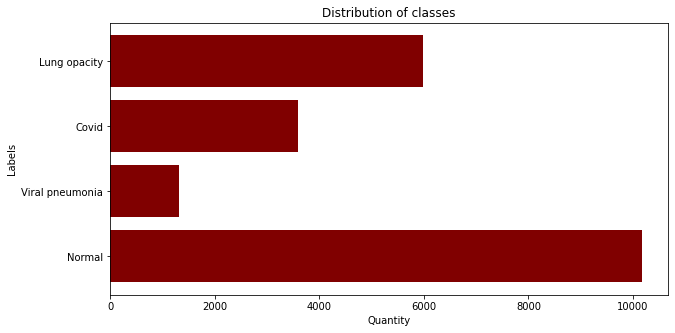

In [10]:
class_names =  ['normal', 'viral_pneumonia', 'covid', 'lung_opacity']
dist = {}
quant = {}
        
for class_name in class_names:
    quant[class_name] = [x for x in os.listdir(train_dirs[class_name]) if x[-3:].lower().endswith('png')]
    dist[class_name.replace('_', ' ').capitalize()] = len(quant[class_name])

courses = list(dist.keys())
values = list(dist.values())
  
fig = plt.figure(figsize=(10, 5))
plt.barh(courses, values, color='maroon')

plt.title("Distribution of classes")
plt.xlabel("Quantity")
plt.ylabel("Labels")
plt.show()

Only the labels of the training set were considered.

## Data Visualization

In [11]:
class_names = train_dataset.class_names


def show_images(images, labels, preds):
    plt.figure(figsize=(20,10))
    for i, image in enumerate(images):
        plt.subplot(1, 6, i + 1, xticks=[], yticks=[])
        image = image.numpy().transpose((1, 2, 0))
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image = image * std + mean
        image = np.clip(image, 0., 1.)
        plt.imshow(image)
        col = 'green'
        if preds[i] != labels[i]:
            col = 'red'
            
        plt.xlabel(f'{class_names[int(labels[i].numpy())]}')
        plt.ylabel(f'{class_names[int(preds[i].numpy())]}', color=col)
    plt.tight_layout()
    plt.show()

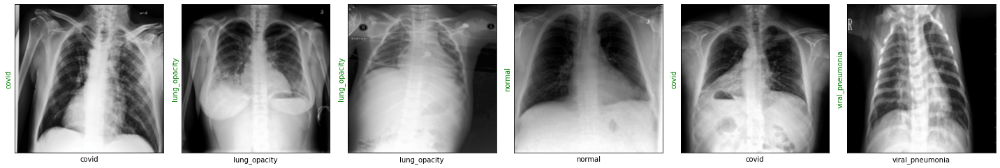

In [12]:
images, labels = next(iter(dl_train))
show_images(images, labels, labels)

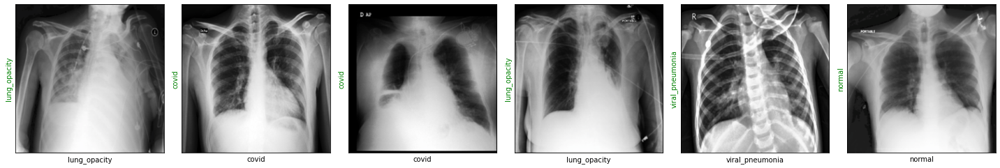

In [13]:
images, labels = next(iter(dl_test))
show_images(images, labels, labels)

## Creating the Model

In [14]:
resnet18 = torchvision.models.resnet18(pretrained=True)

print(resnet18)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [15]:
resnet18.fc = torch.nn.Linear(in_features=512, out_features=4)
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(resnet18.parameters(), lr=3e-5)

In [16]:
def show_preds():
    resnet18.eval()
    images, labels = next(iter(dl_test))
    outputs = resnet18(images)
    _, preds = torch.max(outputs, 1)
    show_images(images, labels, preds)

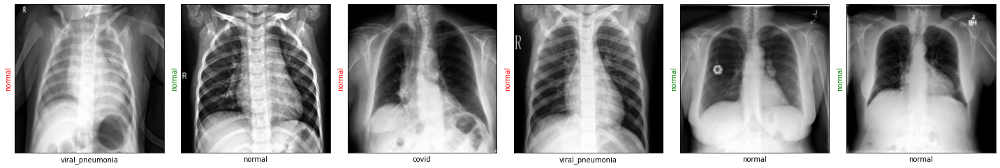

In [17]:
show_preds()

## Training the Model

In [18]:
def train(epochs):
    print('Starting training..')
    for e in range(0, epochs):
        print('='*20)
        print(f'Starting epoch {e + 1}/{epochs}')
        print('='*20)

        train_loss = 0.
        val_loss = 0.

        resnet18.train() # set model to training phase

        for train_step, (images, labels) in enumerate(dl_train):
            optimizer.zero_grad()
            outputs = resnet18(images)
            loss = loss_fn(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            if train_step % 20 == 0:
                print('Evaluating at step', train_step)

                accuracy = 0

                resnet18.eval() # set model to eval phase

                for val_step, (images, labels) in enumerate(dl_test):
                    outputs = resnet18(images)
                    loss = loss_fn(outputs, labels)
                    val_loss += loss.item()

                    _, preds = torch.max(outputs, 1)
                    accuracy += sum((preds == labels).numpy())

                val_loss /= (val_step + 1)
                accuracy = accuracy/len(test_dataset)
                print(f'Validation Loss: {val_loss:.4f}, Accuracy: {accuracy:.4f}')

                show_preds()

                resnet18.train()

                if accuracy >= 0.95:
                    print('Performance condition satisfied, stopping..')
                    return

        train_loss /= (train_step + 1)

        print(f'Training Loss: {train_loss:.4f}')
    print('Training complete..')

Starting training..
Starting epoch 1/1
Evaluating at step 0
Validation Loss: 1.8524, Accuracy: 0.2500


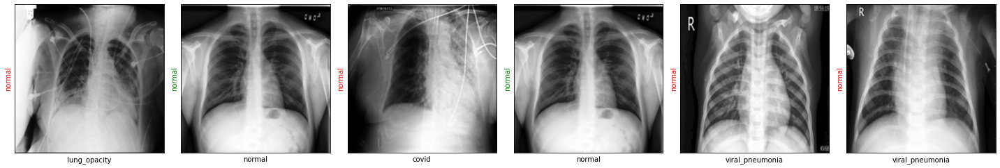

Evaluating at step 20
Validation Loss: 1.1980, Accuracy: 0.4917


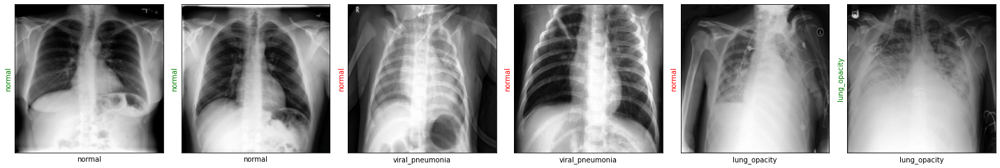

Evaluating at step 40
Validation Loss: 1.0906, Accuracy: 0.5250


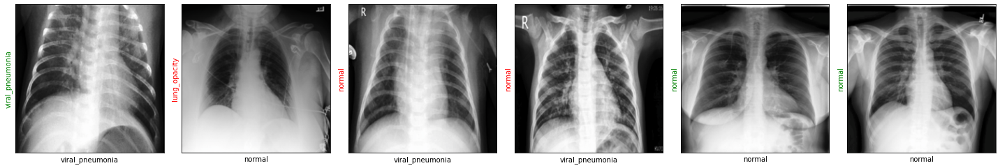

Evaluating at step 60
Validation Loss: 0.6556, Accuracy: 0.7917


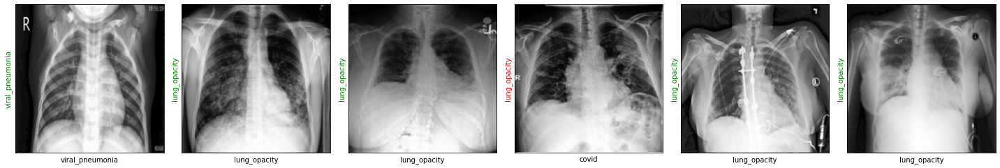

Evaluating at step 80
Validation Loss: 0.5832, Accuracy: 0.7750


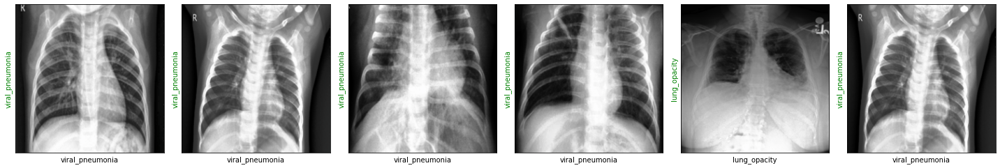

Evaluating at step 100
Validation Loss: 0.4612, Accuracy: 0.8417


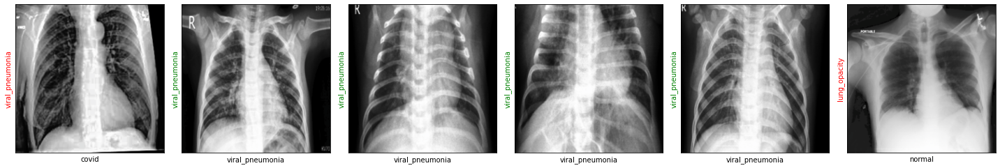

Evaluating at step 120
Validation Loss: 0.4402, Accuracy: 0.8417


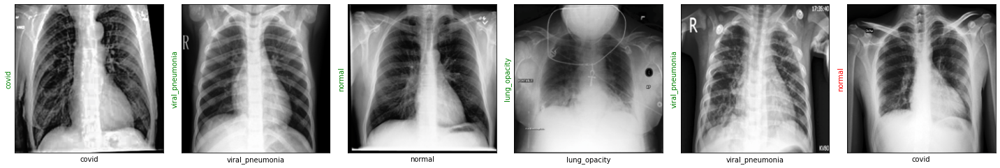

Evaluating at step 140
Validation Loss: 0.3596, Accuracy: 0.8750


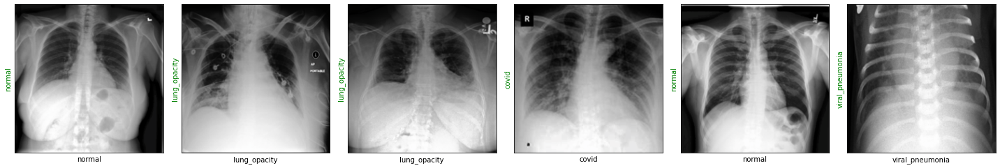

Evaluating at step 160
Validation Loss: 0.4024, Accuracy: 0.8250


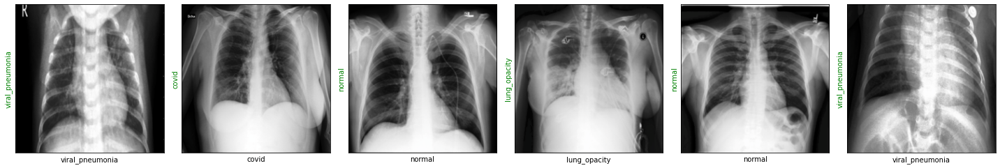

Evaluating at step 180
Validation Loss: 0.3648, Accuracy: 0.8667


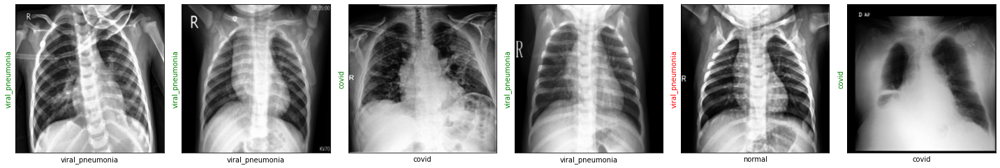

Evaluating at step 200
Validation Loss: 0.2882, Accuracy: 0.9333


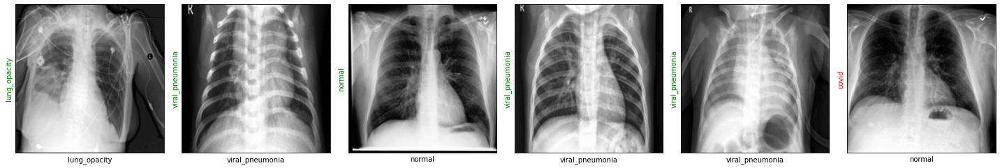

Evaluating at step 220
Validation Loss: 0.3069, Accuracy: 0.9250


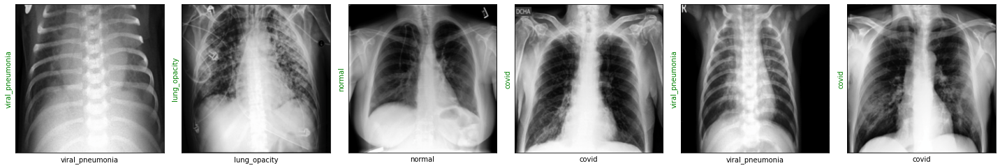

Evaluating at step 240
Validation Loss: 0.3487, Accuracy: 0.8833


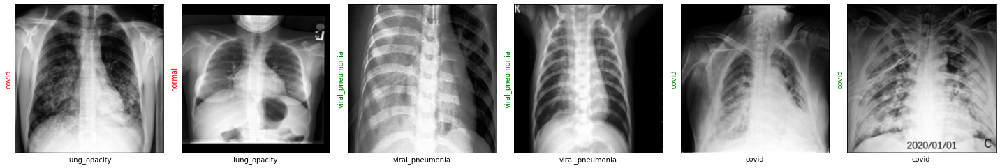

Evaluating at step 260
Validation Loss: 0.3347, Accuracy: 0.8667


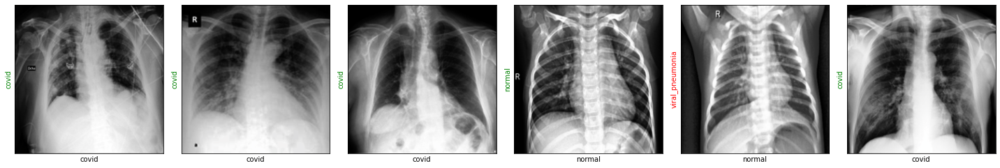

Evaluating at step 280
Validation Loss: 0.3215, Accuracy: 0.8750


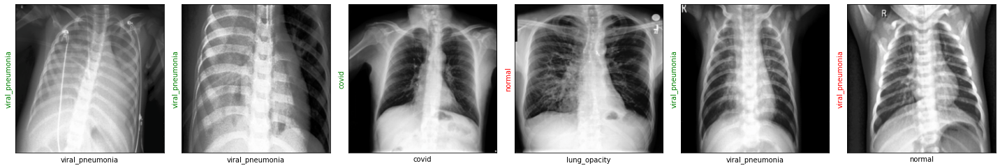

Evaluating at step 300
Validation Loss: 0.4076, Accuracy: 0.8333


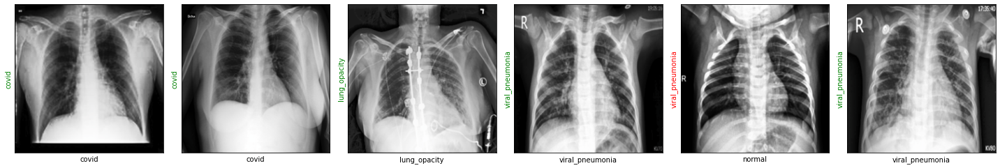

Evaluating at step 320
Validation Loss: 0.4123, Accuracy: 0.8833


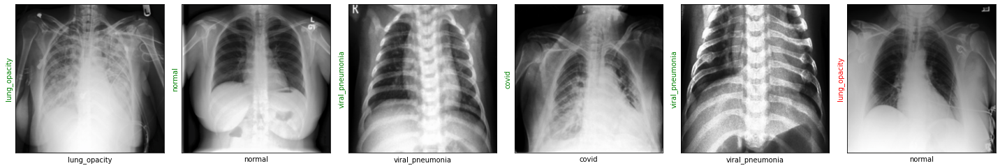

Evaluating at step 340
Validation Loss: 0.3163, Accuracy: 0.9167


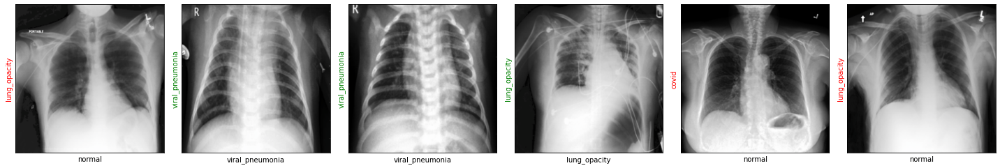

Evaluating at step 360
Validation Loss: 0.2894, Accuracy: 0.9000


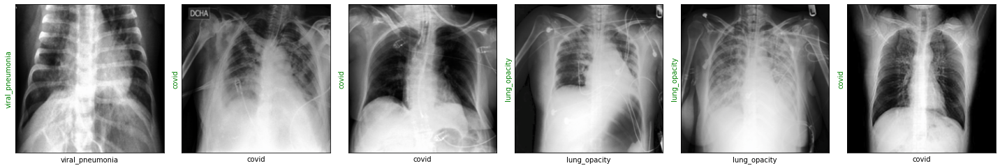

Evaluating at step 380
Validation Loss: 0.2605, Accuracy: 0.8833


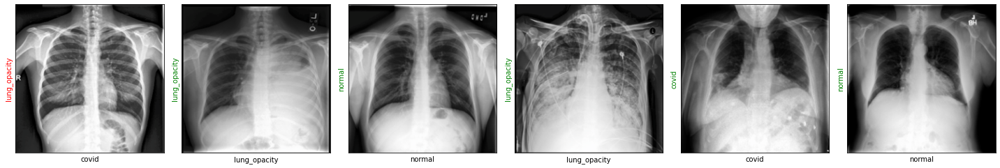

Evaluating at step 400
Validation Loss: 0.3135, Accuracy: 0.8750


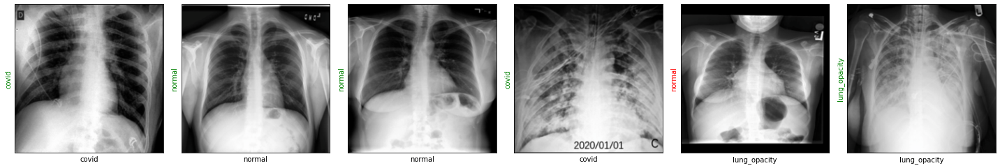

Evaluating at step 420
Validation Loss: 0.2329, Accuracy: 0.9250


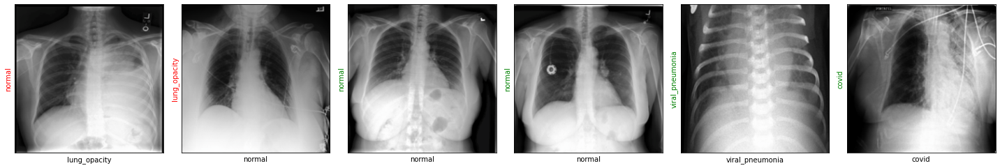

Evaluating at step 440
Validation Loss: 0.2876, Accuracy: 0.9083


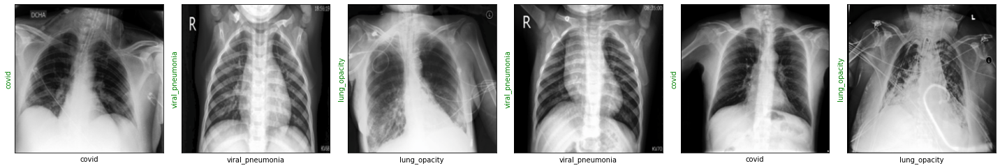

Evaluating at step 460
Validation Loss: 0.2300, Accuracy: 0.9417


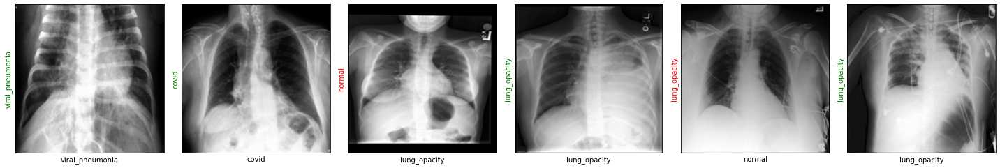

Evaluating at step 480
Validation Loss: 0.2986, Accuracy: 0.8833


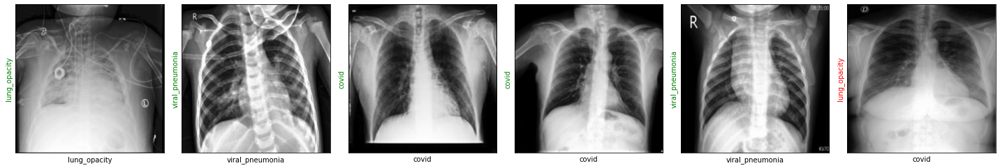

Evaluating at step 500
Validation Loss: 0.2955, Accuracy: 0.8833


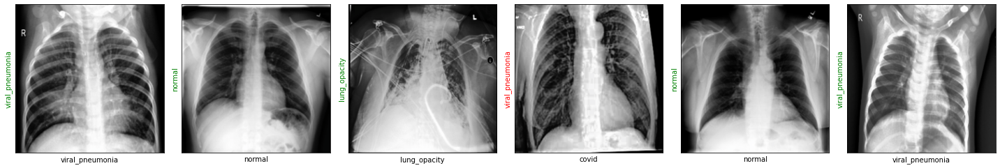

Evaluating at step 520
Validation Loss: 0.2885, Accuracy: 0.9250


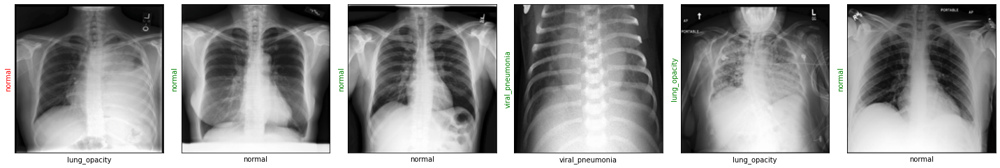

Evaluating at step 540
Validation Loss: 0.2495, Accuracy: 0.9583


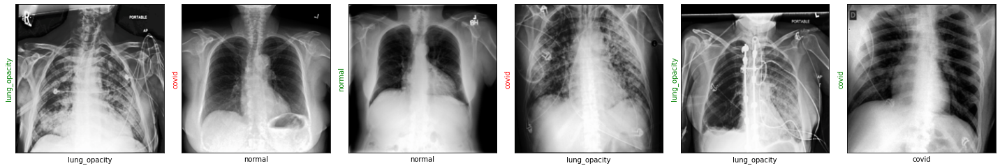

Performance condition satisfied, stopping..
CPU times: user 44min 25s, sys: 17.8 s, total: 44min 43s
Wall time: 7min 39s


In [19]:
%%time

train(epochs=1)

## Final Results

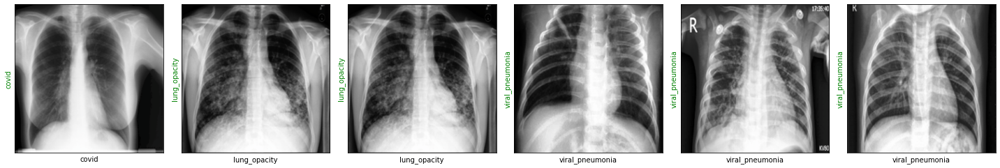

In [20]:
show_preds()

## Exporting the Model

In [21]:
# Export model for gradient visualization
torch.save(resnet18.state_dict(),'bairu.pth')

In [22]:
# Export model for evaluation metrics and mobile implementation
s = torch.jit.script(resnet18)
torch.jit.save(s,'bairu.pt')